# Final Project Notebook

DS 5001 Exploratory Text Analytics | Spring 2024

# Metadata

- Full Name: Gwen Powers
- Userid: gp8cf
- GitHub Repo URL: https://github.com/gwenpowers1/ETA_finalproject
- UVA Box URL: https://virginia.box.com/s/ejttdotqax2culo7i4dur1ocdmlouxqn

# Overview

The goal of the final project is for you to create a **digital analytical edition** of a corpus using the tools, practices, and perspectives you’ve learning in this course. You will select a corpus that has already been digitized and transcribed, parse that into an F-compliant set of tables, and then generate and visualize the results of a series of fitted models. You will also draw some tentative conclusions regarding the linguistic, cultural, psychological, or historical features represented by your corpus. The point of the exercise is to have you work with a corpus through the entire pipeline from ingestion to interpretation. 

Specifically, you will acquire a collection of long-form texts and perform the following operations:

- **Convert** the collection from their source formats (F0) into a set of tables that conform to the Standard Text Analytic Data Model (F2).
- **Annotate** these tables with statistical and linguistic features using NLP libraries such as NLTK (F3).
- **Produce** a vector representation of the corpus to generate TFIDF values to add to the TOKEN (aka CORPUS) and VOCAB tables (F4).
- **Model** the annotated and vectorized model with tables and features derived from the application of unsupervised methods, including PCA, LDA, and word2vec (F5).
- **Explore** your results using statistical and visual methods.
- **Present** conclusions about patterns observed in the corpus by means of these operations.

When you are finished, you will make the results of your work available in GitHub (for code) and UVA Box (for data). You will submit to Gradescope (via Canvas) a PDF version of a Jupyter notebook that contains the information listed below.

# Some Details

- Please fill out your answers in each task below by editing the markdown cell. 
- Replace text that asks you to insert something with the thing, i.e. replace `(INSERT IMAGE HERE)` with an image element, e.g. `![](image.png)`.
- For URLs, just paste the raw URL directly into the text area. Don't worry about providing link labels using `[label](link)`.
- Please do not alter the structure of the document or cell, i.e. the bulleted lists. 
- You may add explanatory paragraphs below the bulleted lists.
- Please name your tables as they are named in each task below.
- Tasks are indicated by headers with point values in parentheses.

# Raw Data

## Source Description (1)

Provide a brief description of your source material, including its provenance and content. Tell us where you found it and what kind of content it contains.

##### I found the entire set of original Nancy Drew Mystery novels on an archive website that had the works split by book in a variety of different formats. I chose .txt files for this project, and I found them to be pretty well organized, requiring only minor tweaking and cleaning of systematic typos. I also took the liberty of adding the ghost author and publication dates from what I could find online in order to provide more features for my analysis.

## Source Features (1)

Add values for the following items. (Do this for all following bulleted lists.)

- Source URL: https://archive.org/details/nancydrew/001%20The%20Secret%20of%20the%20Old%20Clock/page/n133/mode/2up
- UVA Box URL: https://virginia.box.com/s/shpyl5sie1cefby7cfg0qp84gvo5p2ty
- Number of raw documents: 13
- Total size of raw documents (e.g. in MB): 2.626 MB
- File format(s), e.g. XML, plaintext, etc.: .txt

## Source Document Structure (1)

Provide a brief description of the internal structure of each document. That, describe the typical elements found in document and their relation to each other. For example, a corpus of letters might be described as having a date, an addressee, a salutation, a set of content paragraphs, and closing. If they are various structures, state that.

##### Each document is a Nancy Drew Mystery novel that has a title, author, ghost author, a set of labeled chapters, and a publication date. 

# Parsed and Annotated Data

Parse the raw data into the three core tables of your addition: the `LIB`, `CORPUS`, and `VOCAB` tables.

These tables will be stored as CSV files with header rows.

You may consider using `|` as a delimitter.

Provide the following information for each.

## LIB (2)

The source documents the corpus comprises. These may be books, plays, newspaper articles, abstracts, blog posts, etc. 

Note that these are *not* documents in the sense used to describe a bag-of-words representation of a text, e.g. chapter.

- UVA Box URL: https://virginia.box.com/s/8w8wy84p8n6yaovct10wh2ks1gxjhlj0
- GitHub URL for notebook used to create: https://github.com/gwenpowers1/ETA_finalproject/blob/main/FinalProject.ipynb
- Delimitter: '|'
- Number of observations: 13
- List of features, including at least three that may be used for model summarization (e.g. date, author, etc.): book_id, source_file_path, title, author, ghost_author, publication_date, book_len_chars, book_len_terms (added n_chaps and names_in_book after making CORPUS)
- Average length of each document in characters: 196882.23076923078

In [1]:
import pandas as pd
import numpy as np
from glob import glob
import re
import nltk

In [2]:
source_files = 'nancy_drew_files'
source_file_list = sorted(glob(f"{source_files}/*.*"))
book_data = []
chapter_pattern = rf"^CHAPTER\s+[IVXLCM]+\.\s*$"

In [3]:
for idx, source_file_path in enumerate(source_file_list):
    book_id = idx + 1
    with open(source_file_path, 'r', encoding='utf-8') as file:
        text = file.read()
        
        # Making and adding metadata features:
        book_len_chars = len(text) # Length of the book in characters

        tokens = nltk.word_tokenize(text)
        book_len_terms = len(tokens)  # Length of the book in terms
        title_search = re.search(r'(.*)\nBy', text) # Title
        author_search = re.search(r'By (.*) \((.*)\)', text) # Author + Ghost Author
        publication_search = re.search(r'PUBLISHED (\d{4})', text) # Pub date

        if title_search and author_search and publication_search:
            book_title = title_search.group(1).strip()
            author = author_search.group(1).strip()
            ghost_author = author_search.group(2).strip()
            publication_date = publication_search.group(1).strip()
        else:
            book_title = "Unknown"
            author = "Unknown"
            ghost_author = "Unknown"
            publication_date = "Unknown"

        book_data.append((book_id, source_file_path, book_title, author, ghost_author, publication_date, book_len_chars, book_len_terms))

In [4]:
LIB = pd.DataFrame(book_data, columns=['book_id', 'source_file_path', 'title', 'author', 'ghost_author', 'publication_date', 'book_len_chars', 'book_len_terms'])\
    .set_index('book_id').sort_index()

In [5]:
LIB

,source_file_path,title,author,ghost_author,publication_date,book_len_chars,book_len_terms
book_id,,,,,,,
1,nancy_drew_files/001 The Secret of the Old Clo...,THE SECRET OF THE OLD CLOCK,Carolyn Keene,Mildred Wirt,1930,203332,44404
2,nancy_drew_files/002 The Hidden Staircase_djvu...,THE HIDDEN STAIRCASE,Carolyn Keene,Mildred Wirt,1930,209543,45545
3,nancy_drew_files/003 The Bungalow Mystery_djvu...,THE BUNGALOW MYSTERY,Carolyn Keene,Mildred Wirt,1930,193591,42148
4,nancy_drew_files/004 The Mystery at Lilac Inn_...,THE MYSTERY AT LILAC INN,Carolyn Keene,Mildred Wirt,1930,209316,44953
5,nancy_drew_files/005 The Secret of Shadow Ranc...,THE SECRET OF SHADOW RANCH,Carolyn Keene,Mildred Wirt,1931,192707,41801
6,nancy_drew_files/006 The Secret of Red Gate Fa...,THE SECRET OF RED GATE FARM,Carolyn Keene,Mildred Wirt,1931,191805,41927
7,nancy_drew_files/007 The Clue in the Diary_djv...,THE CLUE IN THE DIARY,Carolyn Keene,Mildred Wirt,1932,191366,41811
8,nancy_drew_files/008 Nancy's Mysterious Letter...,NANCY'S MYSTERIOUS LETTER,Carolyn Keene,Walter Karig,1932,187447,41922
9,nancy_drew_files/009 The Sign of the Twisted C...,THE SIGN OF THE TWISTED CANDLES,Carolyn Keene,Walter Karig,1933,195589,43484


In [6]:
LIB['book_len_chars'].mean()

196882.23076923078

### note: added 2 more features to LIB after making CORPUS, so waited to save as csv

## CORPUS (2)

The sequence of word tokens in the corpus, indexed by their location in the corpus and document structures.

- UVA Box URL: https://virginia.box.com/s/yyje5axfhwqx335jvu4bfqfwqota9xxj
- GitHub URL for notebook used to create: https://github.com/gwenpowers1/ETA_finalproject/blob/main/FinalProject.ipynb
- Delimitter:'|'
- Number of observations Between (should be >= 500,000 and <= 2,000,000 observations.): 556,446
- OHCO Structure (as delimitted column names): book_id|chap_num|para_num|sent_num|token_num
- Columns (as delimitted column names, including `token_str`, `term_str`, `pos`, and `pos_group`): token_str|term_str|pos|pos_group

In [7]:
OHCO = ['book_id', 'chap_num', 'para_num', 'sent_num', 'token_num']

In [8]:
from nltk.tokenize import PunktSentenceTokenizer, WordPunctTokenizer
import string

In [9]:
def is_punctuation_or_symbol(token):
    return re.match(r'^[\W_]+$', token) is not None

def custom_tokenize_and_pos_tag(text):
    tokens = WordPunctTokenizer().tokenize(text)
    pos_tags = []
    for token in tokens:
        # Check token is punctuation or a special character
        if is_punctuation_or_symbol(token):
            pos_tags.append((token, 'SYM', 'PUNCT'))
        else:
            tagged = nltk.pos_tag([token])
            pos_tags.append((token, tagged[0][1], 'UNKNOWN'))  
    return pos_tags

In [10]:
def get_pos_group(pos):
    # Map POS tags to simplified groups
    if pos.startswith('N'):
        return 'NN'
    elif pos.startswith('V'):
        return 'VB'
    elif pos == 'CD':
        return 'CD'
    elif pos == 'SYM':
        return 'PUNCT' 
    else:
        return 'OTHER'

In [11]:
def get_pos_group(pos):
    if pos.startswith('N'):
        return 'NN'
    elif pos.startswith('V'):
        return 'VB'
    elif pos == 'CD':
        return 'CD'
    elif pos == '.':
        return 'PUNCT'  # Try to make sure punctuation is correctly categorized
    else:
        return 'XX'  

In [12]:
def tokenize_text(book_id, filepath):
    with open(filepath, 'r', encoding='utf-8') as f:
        text = f.read()
    
    chapters = text.split("CHAPTER")
    token_data = []
    
    for chap_num, chapter in enumerate(chapters):
        if chap_num == 0:
            continue
        
        paragraphs = chapter.split('\n\n')
        for para_num, paragraph in enumerate(paragraphs):
            if not paragraph.strip():
                continue

            sentences = PunktSentenceTokenizer().tokenize(paragraph)
            for sent_num, sentence in enumerate(sentences):
                tagged_tokens = custom_tokenize_and_pos_tag(sentence)
                for token_num, (token_str, pos, pos_group_placeholder) in enumerate(tagged_tokens):
                    term_str = token_str.lower()
                    pos_group = get_pos_group(pos)  
                    
                    token_data.append([book_id, chap_num, para_num, sent_num, token_num, token_str, term_str, pos, pos_group])

    columns = ['book_id', 'chap_num', 'para_num', 'sent_num', 'token_num', 'token_str', 'term_str', 'pos', 'pos_group']
    return pd.DataFrame(token_data, columns=columns)

In [13]:
books = []
for book_id, row in LIB.iterrows():
    tokens = tokenize_text(book_id, row['source_file_path'])
    books.append(tokens)

CORPUS = pd.concat(books)
CORPUS.set_index(['book_id', 'chap_num', 'para_num', 'sent_num', 'token_num'], inplace=True)

In [14]:
CORPUS

token_str   term_str  pos  \
book_id chap_num para_num sent_num token_num                              
1       1        0        0        0                  I          i  PRP   
                                   1                The        the   DT   
                                   2             Rescue     rescue   NN   
                 1        0        0              NANCY      nancy  NNP   
                                   1               DREW       drew   NN   
...                                                 ...        ...  ...   
13      19       94       0        8               good       good   JJ   
                                   9                one        one   CD   
                                   10                 .          .  SYM   
                 96       0        0          PUBLISHED  published   NN   
                                   1               1936       1936   CD   

                                             pos_group  
book_id chap_num para_num sent_num token_num            
1       1        0        0        0                XX  
                                   1                XX  
                                   2                NN  
                 1        0        0                NN  
                                   1                NN  
...                                                ...  
13      19       94       0        8                XX  
                                   9                CD  
                                   10               XX  
                 96       0        0                NN  
                                   1                CD  

[556446 rows x 4 columns]

In [15]:
CORPUS.to_csv('CORPUS.csv', sep='|')

## Update LIB to add more features using CORPUS

In [16]:
LIB['n_chaps'] = CORPUS.reset_index()[['book_id','chap_num']]\
    .drop_duplicates()\
    .groupby('book_id').chap_num.count()

In [17]:
proper_nouns = CORPUS[(CORPUS['pos'] == 'NNP') | (CORPUS['pos'] == 'NNPS') & CORPUS['token_str'].str.istitle()] # Capitalized proper nouns AKA names
proper_nouns.reset_index(inplace=True)

# Drop duplicates
proper_nouns_unique = proper_nouns.drop_duplicates(subset=['book_id', 'term_str'])

# Group by book and count of unique names
unique_proper_noun_counts = proper_nouns_unique.groupby('book_id').size()
LIB['names_in_book'] = unique_proper_noun_counts

In [18]:
LIB

,source_file_path,title,author,ghost_author,publication_date,book_len_chars,book_len_terms,n_chaps,names_in_book
book_id,,,,,,,,,
1,nancy_drew_files/001 The Secret of the Old Clo...,THE SECRET OF THE OLD CLOCK,Carolyn Keene,Mildred Wirt,1930,203332,44404,20,40
2,nancy_drew_files/002 The Hidden Staircase_djvu...,THE HIDDEN STAIRCASE,Carolyn Keene,Mildred Wirt,1930,209543,45545,20,38
3,nancy_drew_files/003 The Bungalow Mystery_djvu...,THE BUNGALOW MYSTERY,Carolyn Keene,Mildred Wirt,1930,193591,42148,20,45
4,nancy_drew_files/004 The Mystery at Lilac Inn_...,THE MYSTERY AT LILAC INN,Carolyn Keene,Mildred Wirt,1930,209316,44953,18,47
5,nancy_drew_files/005 The Secret of Shadow Ranc...,THE SECRET OF SHADOW RANCH,Carolyn Keene,Mildred Wirt,1931,192707,41801,20,32
6,nancy_drew_files/006 The Secret of Red Gate Fa...,THE SECRET OF RED GATE FARM,Carolyn Keene,Mildred Wirt,1931,191805,41927,20,32
7,nancy_drew_files/007 The Clue in the Diary_djv...,THE CLUE IN THE DIARY,Carolyn Keene,Mildred Wirt,1932,191366,41811,20,28
8,nancy_drew_files/008 Nancy's Mysterious Letter...,NANCY'S MYSTERIOUS LETTER,Carolyn Keene,Walter Karig,1932,187447,41922,19,49
9,nancy_drew_files/009 The Sign of the Twisted C...,THE SIGN OF THE TWISTED CANDLES,Carolyn Keene,Walter Karig,1933,195589,43484,20,32


In [19]:
LIB.to_csv('LIB.csv', sep='|')

## VOCAB (2)

The unique word types (terms) in the corpus.

- UVA Box URL: https://virginia.box.com/s/z4oqevh32uezg5ltupiemx2hacvjne5z
- GitHub URL for notebook used to create: https://github.com/gwenpowers1/ETA_finalproject/blob/main/FinalProject.ipynb
- Delimitter: '|'
- Number of observations: 12,953
- Columns (as delimitted names, including `n`, `p`', `i`, `dfidf`, `porter_stem`, `max_pos` and `max_pos_group`, `stop`): n|n_chars|p|i|df|idf|dfidf|max_pos|max_pos_group|stop|porter_stem
- Note: Your VOCAB may contain ngrams. If so, add a feature for `ngram_length`.
- List the top 20 significant words in the corpus by DFIDF.

['hood',
 'removing',
 'smooth',
 'repay',
 'throughout',
 'despair',
 'flipped',
 'slowing',
 'acquaintance',
 'biting',
 'art',
 'brilliantly',
 'mary',
 'puzzles',
 'flickered',
 'nature',
 'increasingly',
 'steered',
 'tool',
 'blouse']

In [20]:
from nltk.corpus import stopwords
from nltk.stem import PorterStemmer

In [21]:
df_counts = CORPUS.reset_index().groupby('term_str')['book_id'].nunique().to_frame('df')

VOCAB = CORPUS['term_str'].value_counts().to_frame('n')
VOCAB.index.name = 'term_str'
VOCAB['n_chars'] = VOCAB.index.str.len() 
VOCAB['p'] = VOCAB['n'] / VOCAB['n'].sum() 
VOCAB['i'] = -np.log2(VOCAB['p']) 

VOCAB = VOCAB.merge(df_counts, left_index=True, right_index=True, how='left')
total_documents = CORPUS.reset_index()['book_id'].nunique()
VOCAB['idf'] = np.log2(total_documents / VOCAB['df'])
VOCAB['dfidf'] = VOCAB['df'] * VOCAB['idf']

VOCAB['max_pos'] = CORPUS.groupby('term_str')['pos'].agg(lambda x: x.mode()[0])
VOCAB['max_pos_group'] = CORPUS.groupby('term_str')['pos_group'].agg(lambda x: x.mode()[0])

sw = set(stopwords.words('english'))
VOCAB['stop'] = VOCAB.index.isin(sw).astype(int)

VOCAB['porter_stem'] = VOCAB.index.map(PorterStemmer().stem)

In [22]:
VOCAB

,n,n_chars,p,i,df,idf,dfidf,max_pos,max_pos_group,stop,porter_stem
term_str,,,,,,,,,,,
.,32402,1,0.058230,4.102087,13,0.000000,0.000000,SYM,XX,0,.
the,28695,3,0.051568,4.277370,13,0.000000,0.000000,DT,XX,1,the
",",18992,1,0.034131,4.872778,13,0.000000,0.000000,SYM,XX,0,","
to,12486,2,0.022439,5.477858,13,0.000000,0.000000,TO,XX,1,to
“,11904,1,0.021393,5.546723,11,0.241008,2.651089,SYM,XX,0,“
...,...,...,...,...,...,...,...,...,...,...,...
inhaling,1,8,0.000002,19.085882,1,3.700440,3.700440,VBG,VB,0,inhal
vein,1,4,0.000002,19.085882,1,3.700440,3.700440,NN,NN,0,vein
disrobed,1,8,0.000002,19.085882,1,3.700440,3.700440,NN,NN,0,disrob


In [23]:
VOCAB.sort_values(by='dfidf', ascending=False).head(20).index.tolist()

['hood',
 'removing',
 'smooth',
 'repay',
 'throughout',
 'despair',
 'flipped',
 'slowing',
 'acquaintance',
 'biting',
 'art',
 'brilliantly',
 'mary',
 'puzzles',
 'flickered',
 'nature',
 'increasingly',
 'steered',
 'tool',
 'blouse']

In [24]:
VOCAB.to_csv('VOCAB.csv', sep='|')

# Derived Tables

## BOW (3)

A bag-of-words representation of the CORPUS.

- UVA Box URL: https://virginia.box.com/s/iifwzg5m0b3454hceqh66bx9t205gayv
- GitHub URL for notebook used to create: https://github.com/gwenpowers1/ETA_finalproject/blob/main/FinalProject.ipynb
- Delimitter: '|'
- Bag (expressed in terms of OHCO levels): ['book_id', 'chap_num']
- Number of observations: 124,263
- Columns (as delimitted names, including `n`, `tfidf`): n|tfidf

In [25]:
nltk.download('stopwords')
stop_words = set(stopwords.words('english'))

[nltk_data] Downloading package stopwords to
[nltk_data]     /Users/gwenpowers/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [26]:
# Noticed symbols and stop words were included in top tfidf words so created a filtered corpus
filtered_CORPUS = CORPUS[
    (~CORPUS['term_str'].isin(stop_words)) & 
    (CORPUS['term_str'].str.contains("^[a-zA-Z]+(?:'[a-zA-Z]+)?$")) # Tried to exclude symbols in contractions
]

In [27]:
# Create BOW
def create_bow(corpus, bag_columns):
    BOW = corpus.groupby(bag_columns + ['term_str'])['term_str'].count().rename('n').reset_index()
    return BOW

# Compute TF-IDF
def compute_tfidf(BOW):
    DTCM = BOW.pivot_table(index=['book_id', 'chap_num'], columns='term_str', values='n', fill_value=0)
    TF = DTCM.div(DTCM.sum(axis=1), axis=0)
    DF = DTCM.astype(bool).sum(axis=0)
    IDF = np.log((len(DTCM) + 1) / (DF + 1)) + 1
    TFIDF = TF.multiply(IDF, axis=1)
    return TFIDF.stack().reset_index().rename(columns={0: 'tfidf'})

# Merge TF-IDF
def merge_tfidf_to_bow(BOW, TFIDF):
    final_BOW = BOW.merge(TFIDF, on=['book_id', 'chap_num', 'term_str'], how='left')
    return final_BOW

In [28]:
# Create BOW
BOW_chap = create_bow(filtered_CORPUS, ['book_id', 'chap_num'])
BOW_chap.to_csv('BOW_chap.csv', sep='|')

In [29]:
# Add tfidf
TFIDF_chap = compute_tfidf(BOW_chap)
BOW = merge_tfidf_to_bow(BOW_chap, TFIDF_chap)
BOW.set_index(['book_id', 'chap_num', 'term_str'], inplace=True)
BOW

n     tfidf
book_id chap_num term_str              
1       1        able       4  0.008544
                 across     2  0.003937
                 ada        2  0.009045
                 address    1  0.002994
                 advancing  1  0.005805
...                        ..       ...
13      19       would      4  0.005380
                 wrists     1  0.005235
                 xx         1  0.005138
                 yes        3  0.004970
                 young      2  0.003146

[134132 rows x 2 columns]

In [30]:
BOW.to_csv('BOW.csv', sep='|')

## DTM (3)

A represenation of the BOW as a sparse count matrix.
 
- UVA Box URL: https://virginia.box.com/s/pc9n5todf5punmj10dh56vgak7x8orsm
- UVA Box URL of BOW used to generate (if applicable): n/a
- GitHub URL for notebook used to create: https://github.com/gwenpowers1/ETA_finalproject/blob/main/FinalProject.ipynb
- Delimitter:'|'
- Bag (expressed in terms of OHCO levels): ['book_id', 'chap_num']

In [31]:
# Using the BOW without tfidf values
DTM = BOW_chap.reset_index().pivot_table(index=['book_id','chap_num'], columns='term_str',values = 'n', fill_value=0)

In [32]:
DTM

term_str          aback  abandon  abandoned  abandoning  abated  abbott  abby  \
book_id chap_num                                                                
1       1             0        0          0           0       0       0     0   
        2             0        0          0           0       0       0     0   
        3             0        0          0           0       0       0     0   
        4             0        0          0           0       0       0     0   
        5             0        0          0           0       0       0     0   
...                 ...      ...        ...         ...     ...     ...   ...   
13      15            0        0          0           0       0       0     0   
        16            0        0          0           0       0       0     0   
        17            0        0          0           0       0       0     0   
        18            0        0          0           1       0       0     0   
        19            0        0          0           0       0       0     0   

term_str          abduct  abducted  abduction  ...  yvonne  zeal  zero  zest  \
book_id chap_num                               ...                             
1       1              0         0          0  ...       0     0     0     0   
        2              0         0          0  ...       0     0     0     0   
        3              0         0          0  ...       0     0     0     0   
        4              0         0          0  ...       0     0     0     0   
        5              0         0          0  ...       0     0     0     0   
...                  ...       ...        ...  ...     ...   ...   ...   ...   
13      15             0         0          0  ...       0     0     0     0   
        16             0         0          0  ...       0     0     0     0   
        17             0         0          0  ...       0     0     0     0   
        18             0         0          0  ...       0     0     0     0   
        19             0         0          0  ...       0     0     0     0   

term_str          zigzag  zip  zipped  zipping  zone  zoomed  
book_id chap_num                                              
1       1              0    0       0        0     0       0  
        2              0    0       0        0     0       0  
        3              0    0       1        0     0       0  
        4              0    0       0        0     0       0  
        5              0    0       0        0     0       0  
...                  ...  ...     ...      ...   ...     ...  
13      15             0    0       0        0     0       0  
        16             0    0       0        0     0       0  
        17             0    0       0        0     0       0  
        18             0    0       0        0     0       0  
        19             0    0       0        0     0       0  

[256 rows x 13109 columns]

In [33]:
DTM.to_csv('DTM.csv', sep='|')

## TFIDF (3)

A Document-Term matrix with TFIDF values.

- UVA Box URL: https://virginia.box.com/s/y82a2fjzw1p0cneagp5zyafw9jxgegvl
- UVA Box URL of DTM or BOW used to create: n/a
- GitHub URL for notebook used to create: https://github.com/gwenpowers1/ETA_finalproject/blob/main/FinalProject.ipynb
- Delimitter: '|'
- Description of TFIDIF formula ($\LaTeX$ OK): 
$$
\text{TF-IDF}(t, d) = \text{TF}(t, d) \times \text{IDF}(t, D) = $$ $$\text{(Freq of Word in Document / Total # Words In Document)} \times \text{(Log of Total # Documents / # Documents containing Word)}$$


In [34]:
TFIDF = BOW.reset_index().pivot_table(index=['book_id','chap_num'], columns='term_str',values = 'tfidf', fill_value=0)

In [35]:
TFIDF

term_str          aback  abandon  abandoned  abandoning  abated  abbott  abby  \
book_id chap_num                                                                
1       1           0.0      0.0        0.0    0.000000     0.0     0.0   0.0   
        2           0.0      0.0        0.0    0.000000     0.0     0.0   0.0   
        3           0.0      0.0        0.0    0.000000     0.0     0.0   0.0   
        4           0.0      0.0        0.0    0.000000     0.0     0.0   0.0   
        5           0.0      0.0        0.0    0.000000     0.0     0.0   0.0   
...                 ...      ...        ...         ...     ...     ...   ...   
13      15          0.0      0.0        0.0    0.000000     0.0     0.0   0.0   
        16          0.0      0.0        0.0    0.000000     0.0     0.0   0.0   
        17          0.0      0.0        0.0    0.000000     0.0     0.0   0.0   
        18          0.0      0.0        0.0    0.005158     0.0     0.0   0.0   
        19          0.0      0.0        0.0    0.000000     0.0     0.0   0.0   

term_str          abduct  abducted  abduction  ...  yvonne  zeal  zero  zest  \
book_id chap_num                               ...                             
1       1            0.0       0.0        0.0  ...     0.0   0.0   0.0   0.0   
        2            0.0       0.0        0.0  ...     0.0   0.0   0.0   0.0   
        3            0.0       0.0        0.0  ...     0.0   0.0   0.0   0.0   
        4            0.0       0.0        0.0  ...     0.0   0.0   0.0   0.0   
        5            0.0       0.0        0.0  ...     0.0   0.0   0.0   0.0   
...                  ...       ...        ...  ...     ...   ...   ...   ...   
13      15           0.0       0.0        0.0  ...     0.0   0.0   0.0   0.0   
        16           0.0       0.0        0.0  ...     0.0   0.0   0.0   0.0   
        17           0.0       0.0        0.0  ...     0.0   0.0   0.0   0.0   
        18           0.0       0.0        0.0  ...     0.0   0.0   0.0   0.0   
        19           0.0       0.0        0.0  ...     0.0   0.0   0.0   0.0   

term_str          zigzag  zip    zipped  zipping  zone  zoomed  
book_id chap_num                                                
1       1            0.0  0.0  0.000000      0.0   0.0     0.0  
        2            0.0  0.0  0.000000      0.0   0.0     0.0  
        3            0.0  0.0  0.005027      0.0   0.0     0.0  
        4            0.0  0.0  0.000000      0.0   0.0     0.0  
        5            0.0  0.0  0.000000      0.0   0.0     0.0  
...                  ...  ...       ...      ...   ...     ...  
13      15           0.0  0.0  0.000000      0.0   0.0     0.0  
        16           0.0  0.0  0.000000      0.0   0.0     0.0  
        17           0.0  0.0  0.000000      0.0   0.0     0.0  
        18           0.0  0.0  0.000000      0.0   0.0     0.0  
        19           0.0  0.0  0.000000      0.0   0.0     0.0  

[256 rows x 13109 columns]

In [36]:
TFIDF.to_csv('TFIDF.csv', sep='|')

## Reduced and Normalized TFIDF_L2 (3)

A Document-Term matrix with L2 normalized TFIDF values.

- UVA Box URL: https://virginia.box.com/s/yasww9wytprfb4pzflsrtb5sqhi6mwbw
- UVA Box URL of source TFIDF table: n/a
- GitHub URL for notebook used to create: https://github.com/gwenpowers1/ETA_finalproject/blob/main/FinalProject.ipynb
- Delimitter: '|'
- Number of features (i.e. significant words):13109
- Principle of significant word selection:

In [37]:
from sklearn.preprocessing import normalize

tfidf_matrix = TFIDF.values
tfidf_l2_normalized = normalize(tfidf_matrix, norm='l2', axis=1)
TFIDF_L2 = pd.DataFrame(tfidf_l2_normalized, index=TFIDF.index, columns=TFIDF.columns)

In [38]:
TFIDF_L2

term_str          aback  abandon  abandoned  abandoning  abated  abbott  abby  \
book_id chap_num                                                                
1       1           0.0      0.0        0.0    0.000000     0.0     0.0   0.0   
        2           0.0      0.0        0.0    0.000000     0.0     0.0   0.0   
        3           0.0      0.0        0.0    0.000000     0.0     0.0   0.0   
        4           0.0      0.0        0.0    0.000000     0.0     0.0   0.0   
        5           0.0      0.0        0.0    0.000000     0.0     0.0   0.0   
...                 ...      ...        ...         ...     ...     ...   ...   
13      15          0.0      0.0        0.0    0.000000     0.0     0.0   0.0   
        16          0.0      0.0        0.0    0.000000     0.0     0.0   0.0   
        17          0.0      0.0        0.0    0.000000     0.0     0.0   0.0   
        18          0.0      0.0        0.0    0.030148     0.0     0.0   0.0   
        19          0.0      0.0        0.0    0.000000     0.0     0.0   0.0   

term_str          abduct  abducted  abduction  ...  yvonne  zeal  zero  zest  \
book_id chap_num                               ...                             
1       1            0.0       0.0        0.0  ...     0.0   0.0   0.0   0.0   
        2            0.0       0.0        0.0  ...     0.0   0.0   0.0   0.0   
        3            0.0       0.0        0.0  ...     0.0   0.0   0.0   0.0   
        4            0.0       0.0        0.0  ...     0.0   0.0   0.0   0.0   
        5            0.0       0.0        0.0  ...     0.0   0.0   0.0   0.0   
...                  ...       ...        ...  ...     ...   ...   ...   ...   
13      15           0.0       0.0        0.0  ...     0.0   0.0   0.0   0.0   
        16           0.0       0.0        0.0  ...     0.0   0.0   0.0   0.0   
        17           0.0       0.0        0.0  ...     0.0   0.0   0.0   0.0   
        18           0.0       0.0        0.0  ...     0.0   0.0   0.0   0.0   
        19           0.0       0.0        0.0  ...     0.0   0.0   0.0   0.0   

term_str          zigzag  zip    zipped  zipping  zone  zoomed  
book_id chap_num                                                
1       1            0.0  0.0  0.000000      0.0   0.0     0.0  
        2            0.0  0.0  0.000000      0.0   0.0     0.0  
        3            0.0  0.0  0.028811      0.0   0.0     0.0  
        4            0.0  0.0  0.000000      0.0   0.0     0.0  
        5            0.0  0.0  0.000000      0.0   0.0     0.0  
...                  ...  ...       ...      ...   ...     ...  
13      15           0.0  0.0  0.000000      0.0   0.0     0.0  
        16           0.0  0.0  0.000000      0.0   0.0     0.0  
        17           0.0  0.0  0.000000      0.0   0.0     0.0  
        18           0.0  0.0  0.000000      0.0   0.0     0.0  
        19           0.0  0.0  0.000000      0.0   0.0     0.0  

[256 rows x 13109 columns]

In [39]:
TFIDF_L2.to_csv('TFIDF_L2.csv', sep='|')

# Models

## PCA Components (4)

- UVA Box URL: https://virginia.box.com/s/cpkjyszayyriavriwgjo3rr6ix7og8ie
- UVA Box URL of the source TFIDF_L2 table: https://virginia.box.com/s/yasww9wytprfb4pzflsrtb5sqhi6mwbw
- GitHub URL for notebook used to create: https://github.com/gwenpowers1/ETA_finalproject/blob/main/FinalProject.ipynb
- Delimitter: '|'
- Number of components: 6
- Library used to generate: sklearn.decomposition, PCA
- Top 5 positive terms for first component: ['helen', 'emily', 'laura', 'flora', 'rosemary']
- Top 5 negative terms for second component: ['cecily', 'helen', 'girls', 'emily', 'niko']

In [40]:
from sklearn.decomposition import PCA

In [41]:
def compute_pca(X, k=6, norm_docs=True):
    if norm_docs:
        X = (X.T / np.linalg.norm(X, axis=1)).T
    pca = PCA(n_components=k)
    pca.fit(X)
    LOADINGS = pd.DataFrame(pca.components_, columns=X.columns)
    DCM = pd.DataFrame(pca.transform(X), index=X.index)
    
    COMPINF = pd.DataFrame({
        'Explained Variance Ratio': pca.explained_variance_ratio_,
        'Cumulative Explained Variance Ratio': np.cumsum(pca.explained_variance_ratio_)
    }, index=[f"PC{i+1}" for i in range(k)])
    
    return LOADINGS, DCM, COMPINF

In [42]:
# Applying PCA
LOADINGS, DCM, COMPINF = compute_pca(TFIDF)

In [43]:
COMPINF

,Explained Variance Ratio,Cumulative Explained Variance Ratio
PC1,0.032844,0.032844
PC2,0.030551,0.063395
PC3,0.028430,0.091825
PC4,0.025415,0.117240
PC5,0.023831,0.141071
PC6,0.022810,0.163881


In [44]:
COMPINF.to_csv('COMPINF.csv', sep='|')

In [45]:
# Top 5 positive terms for first component
top_positive_terms = LOADINGS.iloc[0].nlargest(5).index.tolist()
print("Top 5 positive terms for Component 1:", top_positive_terms)

Top 5 positive terms for Component 1: ['helen', 'emily', 'laura', 'flora', 'rosemary']


In [46]:
# Top 5 negative terms for second component
top_negative_terms = LOADINGS.iloc[1].nsmallest(5).index.tolist()
print("Top 5 negative terms for Component 2:", top_negative_terms)

Top 5 negative terms for Component 2: ['cecily', 'helen', 'girls', 'emily', 'niko']


## PCA DCM (4)

The document-component matrix generated.

- UVA Box URL: https://virginia.box.com/s/vxog5wrggxeq9bumgmxj952lr0ounx0u
- GitHub URL for notebook used to create: https://github.com/gwenpowers1/ETA_finalproject/blob/main/FinalProject.ipynb
- Delimitter: '|'

In [47]:
DCM

0         1         2         3         4         5
book_id chap_num                                                            
1       1         0.027269  0.005530  0.024276  0.001499 -0.011527 -0.000331
        2         0.044583  0.097007  0.069189  0.066330 -0.057875 -0.029757
        3         0.044854  0.046438  0.046860  0.041468 -0.042368 -0.020985
        4         0.032252  0.069729  0.048142  0.054099 -0.039517 -0.020714
        5        -0.066216  0.040042  0.236775 -0.039026  0.009018  0.018399
...                    ...       ...       ...       ...       ...       ...
13      15       -0.143160  0.036995  0.418461 -0.076284  0.007954  0.047349
        16       -0.232726  0.042259  0.578873 -0.119265  0.015000  0.116591
        17       -0.138848  0.074465  0.434313 -0.047223  0.003478  0.036616
        18       -0.232909  0.025319  0.499927 -0.114792  0.063204  0.040963
        19       -0.241705  0.032485  0.481607 -0.121358  0.050326  0.069994

[256 rows x 6 columns]

In [48]:
DCM.to_csv('DCM.csv', sep='|')

## PCA Loadings (4)

The component-term matrix generated.
 
- UVA Box URL: https://virginia.box.com/s/b7jz5bj4ydg9bc8hmt09w4oqlpkomb7q
- GitHub URL for notebook used to create: https://github.com/gwenpowers1/ETA_finalproject/blob/main/FinalProject.ipynb
- Delimitter: '|'

In [49]:
LOADINGS

term_str,aback,abandon,abandoned,abandoning,abated,abbott,abby,abduct,abducted,abduction,...,yvonne,zeal,zero,zest,zigzag,zip,zipped,zipping,zone,zoomed
0,0.000211,-0.000904,-0.013443,-0.001176,0.000128,-0.016050,0.004497,0.003564,-0.000799,0.001510,...,-0.010945,-0.000914,0.000803,0.001400,0.001441,0.000435,-0.000792,0.000022,0.000434,0.000428
1,-0.001992,0.001889,-0.003681,-0.000030,-0.000238,-0.008955,0.005834,-0.000780,-0.001236,-0.001045,...,-0.007457,0.000405,-0.000351,-0.000631,-0.000527,0.000017,-0.000725,0.000063,0.000210,0.000177
2,-0.001008,-0.000053,0.014559,0.004661,0.002456,-0.005701,0.012557,0.000428,0.000872,-0.000250,...,-0.004387,0.003274,-0.000113,0.000506,0.000253,0.000348,-0.001028,-0.000272,0.000292,-0.000100
3,-0.001775,-0.000763,-0.006377,-0.001783,-0.001623,0.000647,0.006049,-0.001118,-0.000749,-0.000934,...,0.000860,-0.000390,-0.000163,-0.000542,-0.000172,0.000114,0.000414,0.000322,0.003643,0.000645
4,0.001902,-0.000824,0.002867,0.000089,-0.000504,0.002904,-0.004781,-0.000605,-0.002530,-0.001094,...,0.001093,-0.000069,0.000244,0.000453,0.000576,-0.000133,0.001130,0.000140,0.000882,-0.000401
5,-0.001757,0.002426,0.009569,0.000301,-0.000402,-0.019987,-0.002631,0.000692,0.005632,0.002259,...,-0.014492,0.000127,-0.000136,-0.000223,0.000141,-0.000233,-0.000712,-0.000277,-0.000439,-0.000060


In [50]:
LOADINGS.to_csv('LOADINGS.csv', sep='|')

## PCA Visualization 1 (4)

Include a scatterplot of documents in the space created by the first two components.

Color the points based on a metadata feature associated with the documents.

Also include a scatterplot of the loadings for the same two components. (This does not need a feature mapped onto color.)

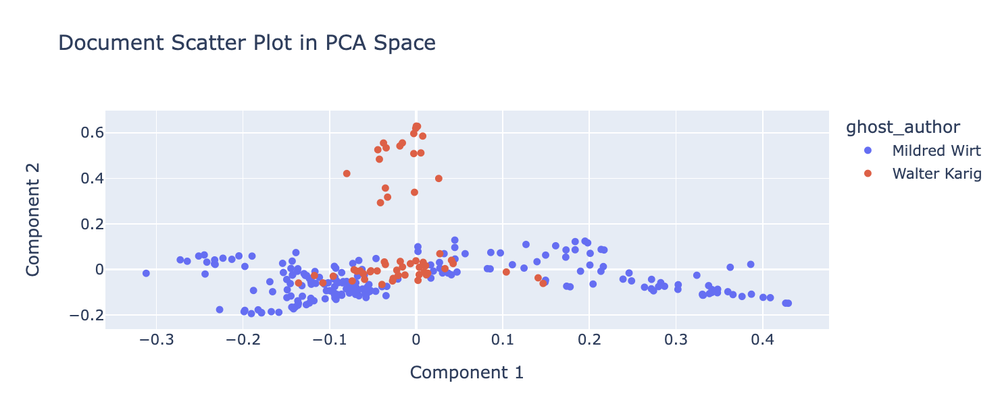
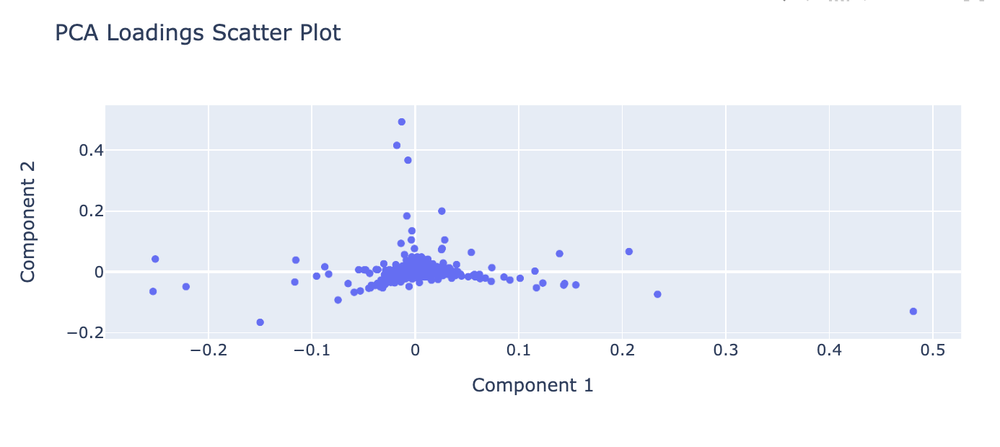

Briefly describe the nature of the polarity you see in the first component:

##### The polarity in the first component indicates a fundamental stylistic or thematic dichotomy between the two authors. Given that Component 1 primarily separates the authors, it might be capturing aspects like usage of certain types of vocabulary, sentence structure, or narrative complexity which are consistently different between Wirt and Karig.

In [51]:
DOC = LIB.copy()  # Add features
DOC = DOC.join(DCM) #Add pca
DOC['PC1'] = DCM[0] 
DOC['PC2'] = DCM[1] 

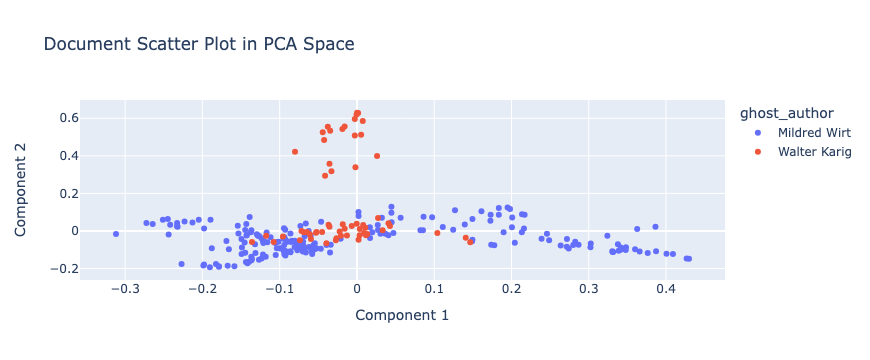

In [52]:
import plotly.express as px

# Docs for first and second components
fig_docs = px.scatter(
    DOC.reset_index(), 
    x=0, 
    y=1, 
    color='ghost_author',
    labels={"0": "Component 1", "1": "Component 2"},
    title="Document Scatter Plot in PCA Space"
)
fig_docs.show()

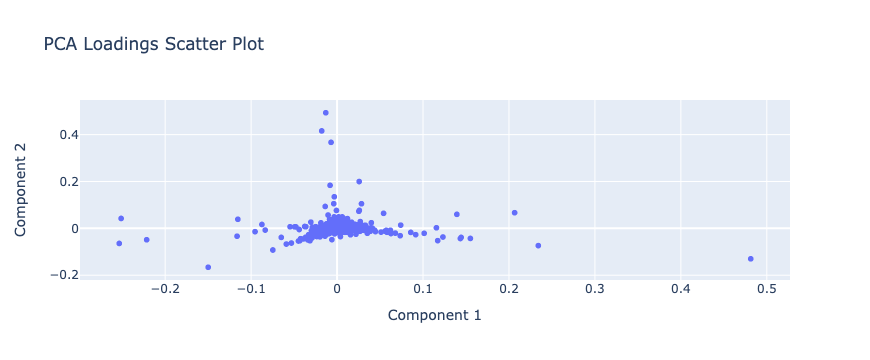

In [53]:
# Loadings for the first and second components
fig_loadings = px.scatter(
    x=LOADINGS.iloc[0],  # First component loadings
    y=LOADINGS.iloc[1],  # Second component loadings
    labels={'x': 'Component 1', 'y': 'Component 2'},
    title="PCA Loadings Scatter Plot"
)
fig_loadings.show()

## PCA Visualization 2 (4)

Include a scatterplot of documents in the space created by the second two components.

Color the points based on a metadata feature associated with the documents.

Also include a scatterplot of the loadings for the same two components. (This does not need a feature mapped onto color.)

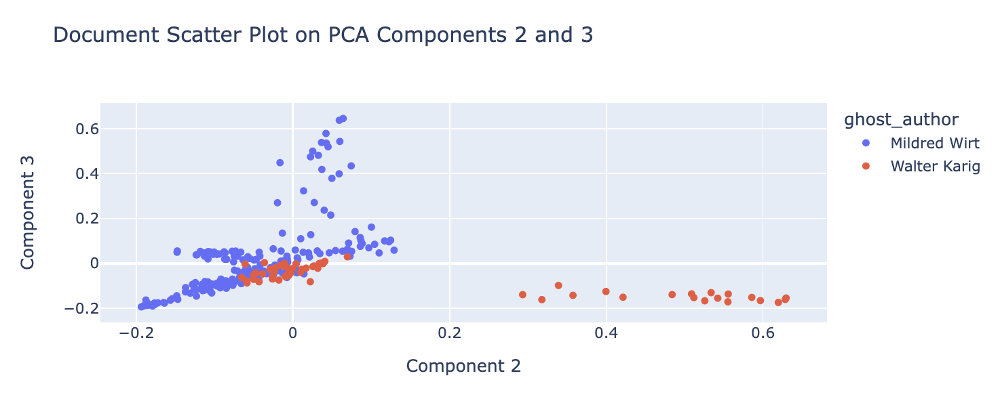
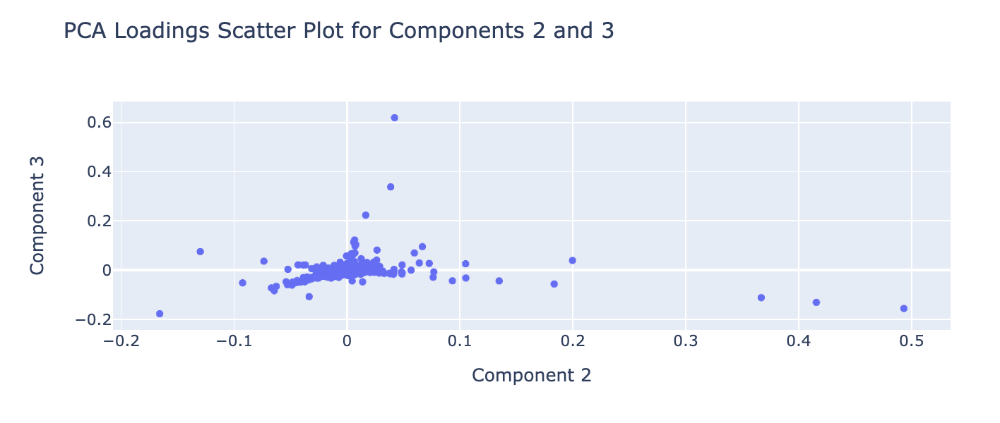

Briefly describe the nature of the polarity you see in the second component:

##### Karig's documents are predominantly on the negative side and Wirt’s scatter towards the center and positive side when looking at the second component, suggesting subtle stylistic or thematic variations. Component 2 might capture underlying differences in narrative techniques or the use of certain types of descriptions and settings that are less overt than those captured by Component 1.

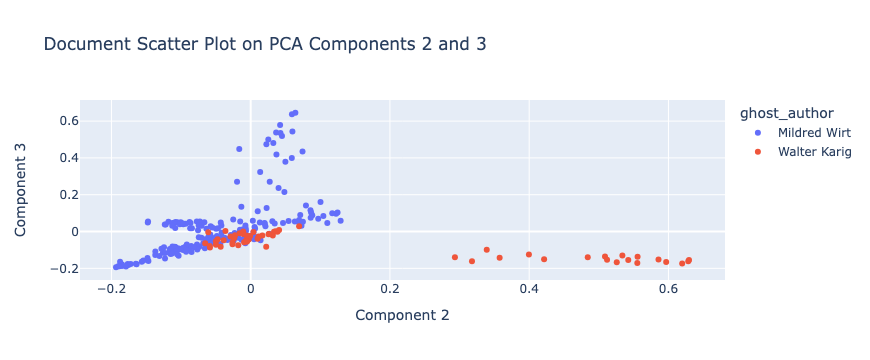

In [54]:
# Docs for second and third components
fig_docs = px.scatter(
    DOC.reset_index(), 
    x=1,  # Assuming the second PCA component is named '1'
    y=2,  # Assuming the third PCA component is named '2'
    color='ghost_author',  # Replace 'genre_id' with the actual metadata column name for coloring
    labels={"1": "Component 2", "2": "Component 3"},
    title="Document Scatter Plot on PCA Components 2 and 3"
)
fig_docs.show()

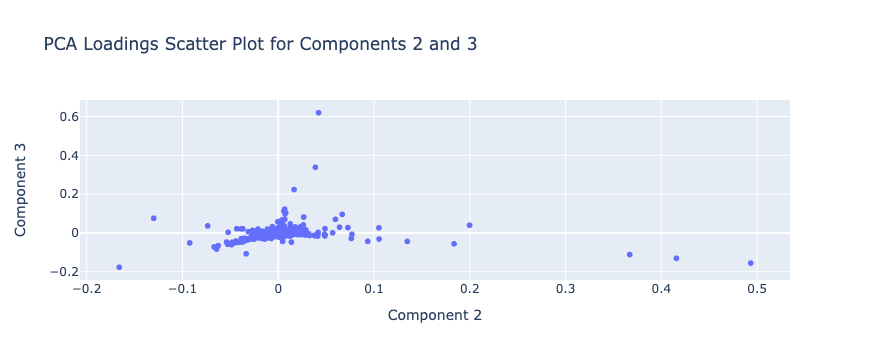

In [55]:
# Loadings for second and third components
fig_loadings = px.scatter(
    x=LOADINGS.iloc[1],  # Second component
    y=LOADINGS.iloc[2],  # Third component
    labels={'x': 'Component 2', 'y': 'Component 3'},
    title="PCA Loadings Scatter Plot for Components 2 and 3"
)
fig_loadings.show()

## LDA TOPIC (4)

- UVA Box URL: https://virginia.box.com/s/13o6ecg1swz7q0btqj76aq36f1yjh778
- UVA Box URL of count matrix used to create: n/a
- GitHub URL for notebook used to create: https://github.com/gwenpowers1/ETA_finalproject/blob/main/FinalProject.ipynb
- Delimitter: '|'
- Libary used to compute: sklearn: CountVectorizer and LatentDirichletAllocation as LDA
- A description of any filtering, e.g. POS (Nouns and Verbs only): nouns and verbs only
- Number of components: 12
- Any other parameters used: max_features = 4000, max_iter = 10, stop_words = 'english'
- Top 5 words and best-guess labels for topic five topics by mean document weight:
 - T00: [nancy	crowley	mr	josiah	topham]
  - T01: [nancy	said	sand	ranch	jug]
  - T02: [nancy	said	mr	ll	asked]
  - T03: [nancy	said	girls	ll	asked]
  - T04: [nancy	said	ll	mr	asked]
  - T05: [nancy	said	ll	mr	bess]

In [56]:
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.decomposition import LatentDirichletAllocation as LDA

In [57]:
# Filtered to nouns and verbs
nv_corpus = CORPUS[CORPUS['pos'].isin(['NN', 'NNS', 'VB', 'VBD', 'VBG', 'VBN', 'VBP', 'VBZ'])]
docs = nv_corpus.groupby(['book_id', 'chap_num']).term_str.apply(lambda terms: ' '.join(terms))

# CountVectorizer configuration
n_components = 7
max_features = 4000
max_iter = 10
vectorizer = CountVectorizer(max_features=max_features, stop_words='english')
data_vectorized = vectorizer.fit_transform(docs)
lda_model = LDA(n_components=n_components, max_iter=max_iter, learning_method='online', random_state=0)
lda_model.fit(data_vectorized)

# Extract feature names to use as DataFrame column headers
words = np.array(vectorizer.get_feature_names_out())

In [58]:
# Topic Data Collection
topic_data = []
num_topics = n_components
num_top_words = 10  # Adjust this to get more or fewer terms per topic

for t in range(num_topics):
    top_terms = np.argsort(lda_model.components_[t])[-num_top_words:][::-1]  # Get indices for top words
    topic_terms = words[top_terms]  # Get the terms themselves
    for rank, term in enumerate(topic_terms):
        topic_data.append((t, rank, term))

In [59]:
LDA_TOPIC = pd.DataFrame(topic_data, columns=['topic_id', 'term_rank', 'term_str'])
LDA_TOPIC = LDA_TOPIC.set_index(['topic_id', 'term_rank']).unstack(level=-1)
LDA_TOPIC.columns = LDA_TOPIC.columns.droplevel(0)  # Remove the multi-level column indexing
LDA_TOPIC

term_rank,0,1,2,3,4,5,6,7,8,9
topic_id,,,,,,,,,,
0,nancy,crowley,mr,josiah,topham,tophams,clock,ll,judy,van
1,nancy,said,sand,ranch,jug,radiator,mr,asked,ll,desert
2,nancy,said,mr,ll,asked,girls,inn,went,know,bess
3,nancy,said,girls,ll,asked,mr,don,laura,told,came
4,nancy,said,ll,mr,asked,laura,told,man,abom,house
5,nancy,said,ll,mr,bess,girls,asked,mrs,man,did
6,nancy,alice,gay,said,girls,ranch,dave,shorty,horse,cabin


In [60]:
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.decomposition import LatentDirichletAllocation as LDA

In [61]:
# Filtered to nouns and verbs
nv_corpus = CORPUS[CORPUS['pos'].isin(['NN', 'NNS', 'VB', 'VBD', 'VBG', 'VBN', 'VBP', 'VBZ'])]
docs = nv_corpus.groupby(['book_id', 'chap_num']).term_str.apply(lambda terms: ' '.join(terms))

# CountVectorizer configuration
n_components = 7
max_features = 4000
max_iter = 10
vectorizer = CountVectorizer(max_features=max_features, stop_words='english')
data_vectorized = vectorizer.fit_transform(docs)
lda_model = LDA(n_components=n_components, max_iter=max_iter, learning_method='online', random_state=0)
lda_model.fit(data_vectorized)

LatentDirichletAllocation(learning_method='online', n_components=7,
                          random_state=0)

In [62]:
# Extract feature names to use as DataFrame column headers
words = np.array(vectorizer.get_feature_names_out())

# Topic Data Collection
topic_data = []
num_topics = n_components
num_top_words = 5

for t in range(num_topics):
    top_terms = np.argsort(lda_model.components_[t])[-num_top_words:][::-1]  # Get indices for top words
    topic_terms = words[top_terms]  # Get the terms themselves
    for rank, term in enumerate(topic_terms):
        topic_data.append((t, rank, term))

In [63]:
# Creating DataFrame from the topic data
LDA_TOPIC = pd.DataFrame(topic_data, columns=['topic_id', 'term_rank', 'term_str'])
LDA_TOPIC = LDA_TOPIC.set_index(['topic_id', 'term_rank']).unstack(level=-1)
LDA_TOPIC.columns = LDA_TOPIC.columns.droplevel(0)  # Remove the multi-level column indexing
LDA_TOPIC

term_rank,0,1,2,3,4
topic_id,,,,,
0,nancy,crowley,mr,josiah,topham
1,nancy,said,sand,ranch,jug
2,nancy,said,mr,ll,asked
3,nancy,said,girls,ll,asked
4,nancy,said,ll,mr,asked
5,nancy,said,ll,mr,bess
6,nancy,alice,gay,said,girls


In [64]:
LDA_TOPIC.to_csv('LDA_TOPIC.csv', sep='|')

## LDA THETA (4)

- UVA Box URL: https://virginia.box.com/s/ffrcg6i4vt1sho7lyey2blv7tgsuvvop
- GitHub URL for notebook used to create: https://github.com/gwenpowers1/ETA_finalproject/blob/main/FinalProject.ipynb
- Delimitter: '|'

In [65]:
lda_theta = lda_model.fit_transform(data_vectorized)
LDA_THETA = pd.DataFrame(lda_theta, 
                        index=pd.MultiIndex.from_tuples([(b, c) for b, c in docs.index], names=['book_id', 'chap_num']),
                        columns=[f'Topic {i}' for i in range(n_components)])

LDA_THETA

Topic 0   Topic 1   Topic 2   Topic 3   Topic 4   Topic 5  \
book_id chap_num                                                               
1       1         0.369984  0.000214  0.000214  0.000214  0.000214  0.628947   
        2         0.427678  0.000221  0.000220  0.000221  0.000221  0.571219   
        3         0.549082  0.000201  0.000201  0.000201  0.000201  0.449914   
        4         0.257609  0.000234  0.000233  0.000234  0.000233  0.741223   
        5         0.167230  0.000236  0.000236  0.000236  0.000236  0.831590   
...                    ...       ...       ...       ...       ...       ...   
13      15        0.000276  0.000275  0.000275  0.000275  0.000275  0.998347   
        16        0.000287  0.000286  0.000286  0.000286  0.000286  0.998281   
        17        0.000325  0.000324  0.000324  0.000324  0.000324  0.998054   
        18        0.000197  0.000196  0.000196  0.000196  0.000196  0.998823   
        19        0.000260  0.000259  0.000259  0.000259  0.000259  0.998443   

                   Topic 6  
book_id chap_num            
1       1         0.000214  
        2         0.000221  
        3         0.000201  
        4         0.000234  
        5         0.000236  
...                    ...  
13      15        0.000276  
        16        0.000287  
        17        0.000325  
        18        0.000197  
        19        0.000260  

[256 rows x 7 columns]

In [66]:
LDA_THETA.to_csv('LDA_THETA.csv', sep='|')

## LDA PHI (4)

- UVA Box URL: https://virginia.box.com/s/5iygaq7vkvbqpsyrx8glkxrmc2odmzrz
- GitHub URL for notebook used to create: https://github.com/gwenpowers1/ETA_finalproject/blob/main/FinalProject.ipynb
- Delimitter: '|'

In [67]:
# Extract terms and topics
terms = vectorizer.get_feature_names_out()
topic_term_matrix = lda_model.components_

# Normalize to probabilities
LDA_PHI = pd.DataFrame(topic_term_matrix, columns=terms, index=[f'Topic {i}' for i in range(n_components)])
LDA_PHI = LDA_PHI.div(LDA_PHI.sum(axis=1), axis=0)
LDA_PHI

,abandoned,abbott,abducted,abductors,ability,aboard,abom,aboms,abreast,abrupt,...,year,years,yell,yelled,yellow,yep,yes,yesterday,youth,yvonne
Topic 0,0.000047,0.000052,0.000044,0.000041,0.000038,0.000056,0.000180,0.000057,0.000039,0.000039,...,0.000591,0.000942,0.000052,0.000043,0.000051,0.000041,0.000368,0.000056,0.000043,0.000049
Topic 1,0.000230,0.000204,0.000211,0.000193,0.000204,0.000206,0.000977,0.000377,0.000215,0.000207,...,0.000240,0.000330,0.000223,0.000225,0.000197,0.000206,0.000287,0.000240,0.000209,0.000192
Topic 2,0.000237,0.000254,0.000241,0.000227,0.000242,0.000257,0.000247,0.000242,0.000233,0.000235,...,0.000260,0.000283,0.000244,0.000230,0.000242,0.000237,0.000257,0.000265,0.000244,0.000288
Topic 3,0.000228,0.000255,0.000211,0.000214,0.000220,0.000214,0.000664,0.000329,0.000219,0.000204,...,0.000269,0.000308,0.000223,0.000214,0.000225,0.000211,0.000246,0.000267,0.000257,0.000271
Topic 4,0.000220,0.000243,0.000223,0.000235,0.000243,0.000233,0.000787,0.000269,0.000214,0.000233,...,0.000224,0.000311,0.000230,0.000231,0.000223,0.000219,0.000249,0.000272,0.000232,0.000264
Topic 5,0.000155,0.000173,0.000041,0.000048,0.000048,0.000078,0.000990,0.000278,0.000033,0.000047,...,0.000288,0.000688,0.000065,0.000112,0.000142,0.000035,0.000393,0.000197,0.000071,0.000156
Topic 6,0.000041,0.000057,0.000029,0.000028,0.000030,0.000807,0.005277,0.000051,0.000032,0.000027,...,0.000041,0.000173,0.000301,0.000038,0.000111,0.000027,0.000044,0.000150,0.000049,0.000038


In [68]:
LDA_PHI.to_csv('LDA_PHI.csv', sep='|')

## LDA + PCA Visualization (4)

Apply PCA to the PHI table and plot the topics in the space opened by the first two components.

Size the points based on the mean document weight of each topic (using the THETA table).

Color the points based on a metadata feature from the LIB table.

Provide a brief interpretation of what you see.

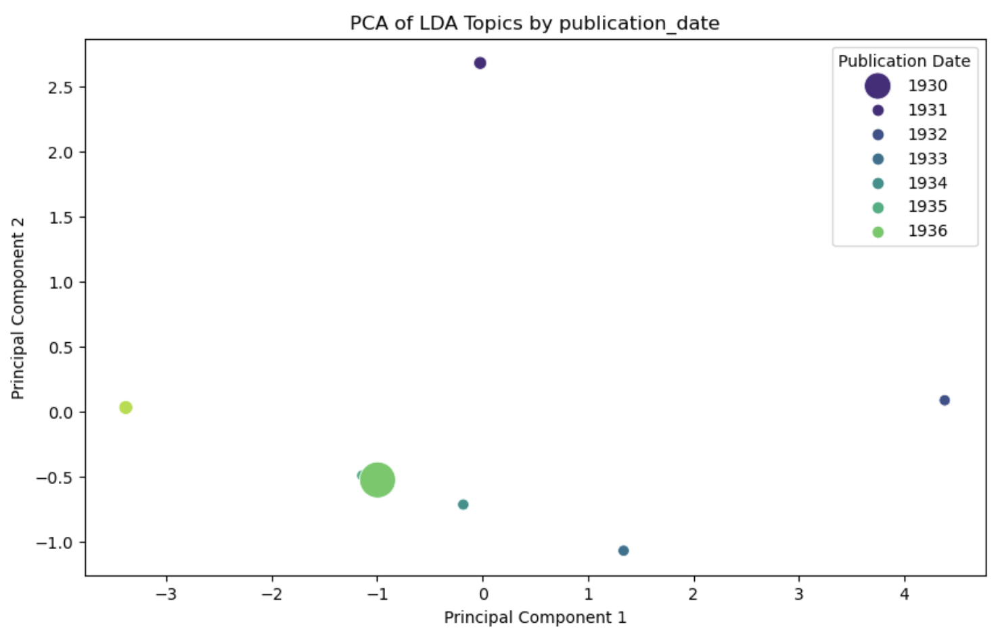

#####  In this plot, each dot represents the thematic composition of publications from a specific year, plotted according to their scores on the first two components and sized based on their theta values. Notably, there is a trend where earlier years (1930-1932) are positioned more negatively on the first principal component and later years (1934-1936) more positively, suggesting a possible shift in the thematic content or style of the publications over these years. 1936 has the largest dot indicating its average significance or contribution of topics to the documents was higher.

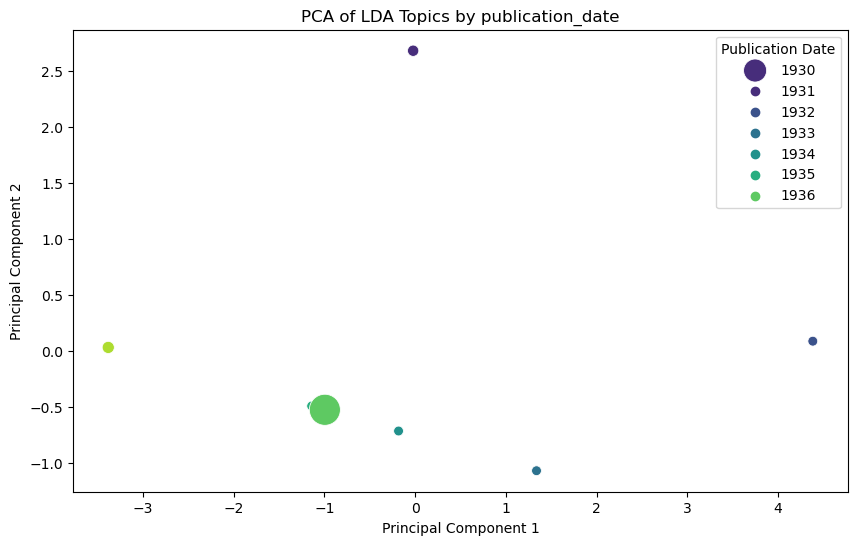

In [69]:
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler

if 'chap_num' in LDA_THETA.index.names:
    theta_with_metadata = LDA_THETA.reset_index(level='chap_num', drop=True)
else:
    theta_with_metadata = LDA_THETA.copy()

# Remove duplicates
theta_with_metadata = theta_with_metadata[~theta_with_metadata.index.duplicated(keep='first')]

# Add publication date from LIB
theta_with_metadata = theta_with_metadata.join(LIB['publication_date'])
grouped_theta = theta_with_metadata.groupby('publication_date').mean()
mean_topic_weights = LDA_THETA.mean(axis=0).values

# Standardize data
scaler = StandardScaler()
grouped_scaled = scaler.fit_transform(grouped_theta)

# Perform PCA
pca = PCA(n_components=2)
grouped_pca = pca.fit_transform(grouped_scaled)
grouped_pca_df = pd.DataFrame(grouped_pca, columns=['PC1', 'PC2'], index=grouped_theta.index)

# Plot
plt.figure(figsize=(10, 6))
scatter = sns.scatterplot(x='PC1', y='PC2', hue=grouped_pca_df.index, data=grouped_pca_df, palette='viridis', size=mean_topic_weights, sizes=(50, 500))
legend_labels = [str(date)[:4] for date in grouped_pca_df.index]
scatter.legend(title='Publication Date', labels=legend_labels)
plt.title('PCA of LDA Topics by publication_date')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')

plt.show()


## Sentiment VOCAB_SENT (4)

Sentiment values associated with a subset of the VOCAB from a curated sentiment lexicon.

- UVABox URL: https://virginia.box.com/s/h4fpwm6nvu3w2q4u5vj07475kpnjs1aa
- UVA Box URL for source lexicon: https://virginia.box.com/s/z4oqevh32uezg5ltupiemx2hacvjne5z
- GitHub URL for notebook used to create: https://github.com/gwenpowers1/ETA_finalproject/blob/main/FinalProject.ipynb
- Delimitter: '|'

In [70]:
from nltk.sentiment.vader import SentimentIntensityAnalyzer

In [71]:
# Initialize VADER
sid = SentimentIntensityAnalyzer()

# Thresholds
positive_threshold = 0.01
negative_threshold = -0.01

VOCAB_SENT = pd.DataFrame(index=VOCAB.index, columns=['Sentiment_Score'])

for word in VOCAB.index:
    # Find sentiment score
    sentiment_score = sid.polarity_scores(word)['compound']
    
    # Adjust based on thresholds
    if sentiment_score > positive_threshold:
        sentiment_category = 'Positive'
    elif sentiment_score < negative_threshold:
        sentiment_category = 'Negative'
    else:
        sentiment_category = 'Neutral'
    
    # Add sentiment score
    VOCAB_SENT.at[word, 'Sentiment_Score'] = sentiment_score
    VOCAB_SENT.at[word, 'Sentiment_Category'] = sentiment_category

In [72]:
VOCAB_SENT.sample(10)

,Sentiment_Score,Sentiment_Category
term_str,,
trumpet,0.0,Neutral
comfortingly,0.4019,Positive
torturous,-0.5719,Negative
costumed,0.0,Neutral
whines,-0.4215,Negative
flakes,0.0,Neutral
drably,0.0,Neutral
cloud,0.0,Neutral
psychological,0.0,Neutral


In [73]:
VOCAB_SENT.to_csv('VOCAB_SENT.csv', sep='|')

## Sentiment BOW_SENT (4)

Sentiment values from VOCAB_SENT mapped onto BOW.

- UVA Box URL: https://virginia.box.com/s/5v6ae85tzpa917e9kagwj0xmdmozhw1x
- GitHub URL for notebook used to create: https://github.com/gwenpowers1/ETA_finalproject/blob/main/FinalProject.ipynb
- Delimitter: '|'

In [74]:
BOW_SENT = BOW.reset_index().merge(
    VOCAB_SENT, 
    left_on='term_str', 
    right_index=True,
    how='left'
)

# Add sentiment for each term (term frequency x sentiment score)
BOW_SENT['term_sentiment'] = BOW_SENT['n'] * BOW_SENT['Sentiment_Score']
BOW_SENT.set_index(['book_id', 'chap_num', 'term_str'], inplace=True)

In [75]:
BOW_SENT

n     tfidf Sentiment_Score Sentiment_Category  \
book_id chap_num term_str                                                    
1       1        able       4  0.008544             0.0            Neutral   
                 across     2  0.003937             0.0            Neutral   
                 ada        2  0.009045             0.0            Neutral   
                 address    1  0.002994             0.0            Neutral   
                 advancing  1  0.005805             0.0            Neutral   
...                        ..       ...             ...                ...   
13      19       would      4  0.005380             0.0            Neutral   
                 wrists     1  0.005235             0.0            Neutral   
                 xx         1  0.005138             0.0            Neutral   
                 yes        3  0.004970          0.4019           Positive   
                 young      2  0.003146             0.0            Neutral   

                           term_sentiment  
book_id chap_num term_str                  
1       1        able                 0.0  
                 across               0.0  
                 ada                  0.0  
                 address              0.0  
                 advancing            0.0  
...                                   ...  
13      19       would                0.0  
                 wrists               0.0  
                 xx                   0.0  
                 yes               1.2057  
                 young                0.0  

[134132 rows x 5 columns]

In [76]:
BOW_SENT.to_csv('BOW_SENT.csv', sep='|')

## Sentiment DOC_SENT (4)

Computed sentiment per bag computed from BOW_SENT.

- UVA Box URL: https://virginia.box.com/s/d3cc8c878hadxf4ccr2gz091o9rvqakh
- GitHub URL for notebook used to create: https://github.com/gwenpowers1/ETA_finalproject/blob/main/FinalProject.ipynb
- Delimitter: '|'
- Document bag expressed in terms of OHCO levels: (book_id, chap_num)

In [77]:
# Find weighted sentiment score for each term in each document
BOW_SENT['weighted_sentiment'] = BOW_SENT['tfidf'] * BOW_SENT['Sentiment_Score']

DOC_SENT = BOW_SENT.groupby(['book_id', 'chap_num']).apply(
    lambda df: np.sum(df['weighted_sentiment']) / np.sum(df['tfidf']) if np.sum(df['tfidf']) != 0 else 0
).reset_index(name='avg_sentiment')

In [78]:
DOC_SENT

,book_id,chap_num,avg_sentiment
0,1,1,0.009922
1,1,2,0.012070
2,1,3,0.000160
3,1,4,0.014938
4,1,5,0.049245
...,...,...,...
251,13,15,-0.002165
252,13,16,-0.008039
253,13,17,0.001105
254,13,18,-0.011383


In [79]:
DOC_SENT.to_csv('DOC_SENT.csv', sep='|')

## Sentiment Plot (4)

Plot sentiment over some metric space, such as time.

If you don't have a metric metadata features, plot sentiment over a feature of your choice.

You may use a bar chart or a line graph.

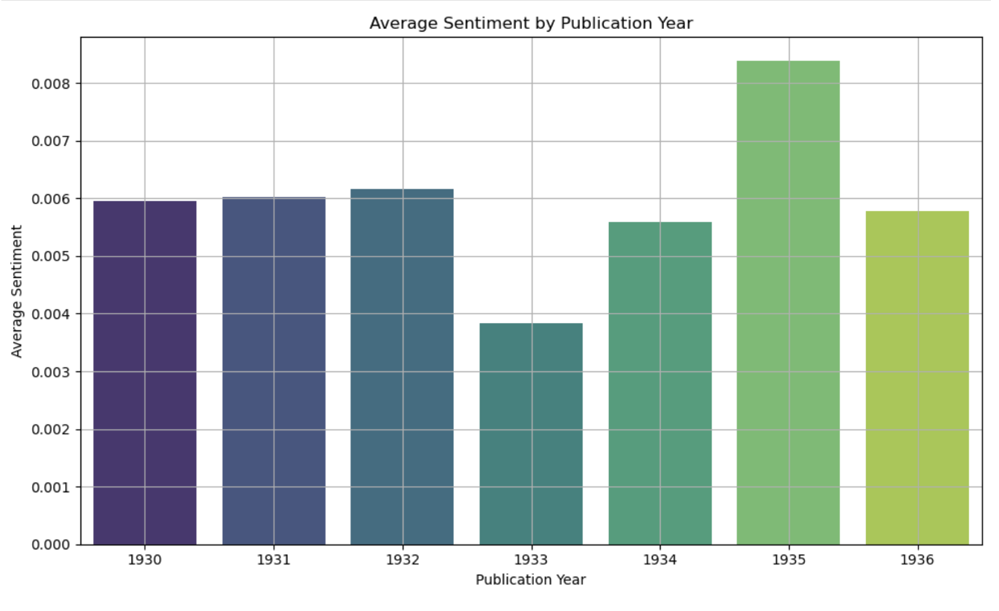

##### This bar chart shows a noticeable increase in average sentiment from 1930 to 1934, suggesting a shift towards more positive content in the publications over these years. However, the sentiment slightly declines in 1935 before picking up again in 1936, indicating variations in the thematic or emotional content of the publications across these years.

In [80]:
import matplotlib.pyplot as plt
import seaborn as sns

# Merge with the publication dates from LIB
merged_data = DOC_SENT.merge(LIB[['publication_date']], left_on='book_id', right_index=True, how='left')

# Find mean sentiment by publication date
grouped_data = merged_data.groupby('publication_date')['avg_sentiment'].mean().reset_index()

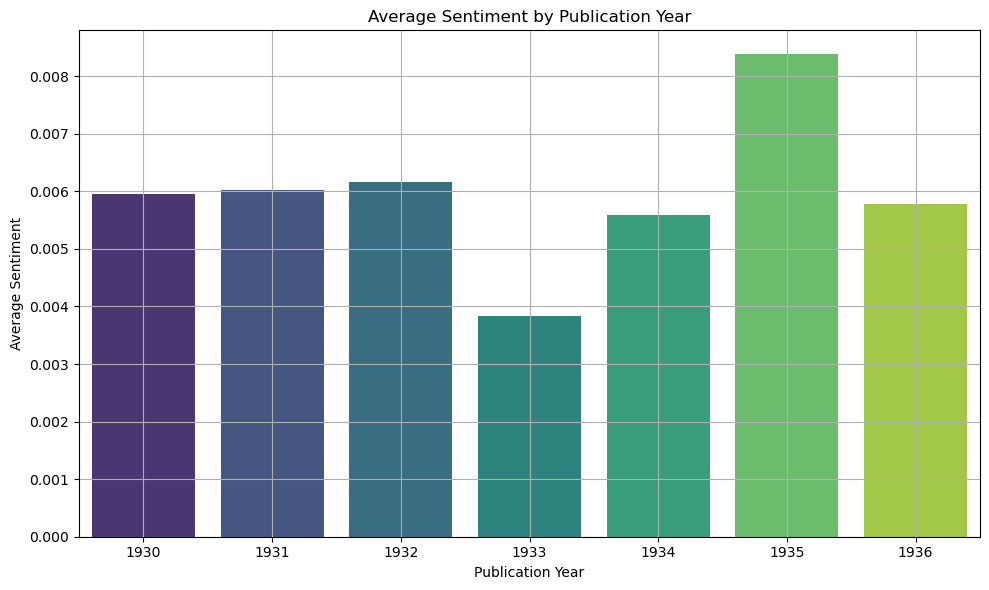

In [81]:
# Plot
plt.figure(figsize=(10, 6))
sns.barplot(data=grouped_data, x='publication_date', y='avg_sentiment', palette='viridis')
plt.title('Average Sentiment by Publication Year')
plt.xlabel('Publication Year')
plt.ylabel('Average Sentiment')
plt.grid(True)
plt.tight_layout()
plt.show()

## VOCAB_W2V (4)

A table of word2vec features associated with terms in the VOCAB table.

- UVA Box URL: https://virginia.box.com/s/qfgfcbwmqaaveikxeixjgf32lsmv8y07
- GitHub URL for notebook used to create: https://github.com/gwenpowers1/ETA_finalproject/blob/main/FinalProject.ipynb
- Delimitter: '|'
- Document bag expressed in terms of OHCO levels: ['book_id', 'chap_num']
- Number of features generated: 256
- The library used to generate the embeddings: Word2Vec, TSNE

In [82]:
from gensim.models import Word2Vec
from sklearn.manifold import TSNE
from sklearn.cluster import KMeans
import plotly.express as px

class W2VExplorer:
    
    w2v_min_count = 10
    w2v_workers = 4
    w2v_size = 256
    w2v_window = 2
    tsne_perplexity = 40
    tsne_n_components = 2
    tsne_init = 'pca'
    tsne_n_iter = 2500
    tsne_random_state = 23
        
    def __init__(self, tokens, vocab, bag):
        self.TOKENS = tokens
        self.VOCAB = vocab
        self.BAG = bag
        
    def generate_model(self):
        print("Bag:", self.BAG[-1])
        print('Getting DOCS')
        self._get_docs()
        print("Getting MODEL")
        self._get_model()
        print("Filtering VOCAB terms and getting Embeddings")
        self._get_embeddings()
        print("Getting tSNE Coords")
        self._get_tsne_coords()
        print(u'\u2713')  # Checkmark
        return self
        
    def _get_docs(self):
        """Create a list of documents for Gensim, ensuring only terms in VOCAB are included."""
        self.DOCS = self.TOKENS[self.TOKENS.term_str.isin(self.VOCAB.index)].groupby(self.BAG)\
            .term_str.apply(lambda x: x.tolist())\
            .reset_index()['term_str'].tolist()
        
    def _get_model(self):
        """Run Word2Vec against the docs."""
        self.model = Word2Vec(self.DOCS, 
                              vector_size=self.w2v_size, 
                              window=self.w2v_window, 
                              min_count=self.w2v_min_count, 
                              workers=self.w2v_workers)

    def _get_embeddings(self):
        """Extract embeddings for terms that are present in both model and VOCAB."""
        self.embeddings = {word: self.model.wv[word] for word in self.model.wv.key_to_index if word in self.VOCAB.index}
        
    def _get_tsne_coords(self):
        """Run t-SNE on the filtered embeddings."""
        embeddings_df = pd.DataFrame(list(self.embeddings.values()), index=self.embeddings.keys())
        self.tsne_model = TSNE(perplexity=self.tsne_perplexity, 
                               n_components=self.tsne_n_components, 
                               init=self.tsne_init, 
                               n_iter=self.tsne_n_iter, 
                               random_state=self.tsne_random_state)
        tsne_results = self.tsne_model.fit_transform(embeddings_df)
        self.coords = pd.DataFrame(tsne_results, columns=['x', 'y'], index=embeddings_df.index)
        
    def plot_tsne(self):
        """Plot t-SNE results using Plotly with clustering and labeling of cluster centers."""
        tsne_df = pd.DataFrame(self.coords.values, columns=['Component 1', 'Component 2'])
        tsne_df['words'] = self.coords.index

        fig = px.scatter(tsne_df, x='Component 1', y='Component 2', hover_name='words', hover_data=['words'])
        fig.update_traces(marker=dict(size=5, opacity=0.5))
        fig.update_layout(title='t-SNE projection of the word vectors', xaxis_title='Component 1', yaxis_title='Component 2', 
                          title_x=0.5, showlegend=False)
        fig.show()


In [83]:
w2v_explorer = W2VExplorer(CORPUS, VOCAB, ['book_id', 'chap_num']) #chose to include entire corpus with stop words and symbols
w2v_explorer.generate_model()

Bag: chap_num
Getting DOCS
Getting MODEL
Filtering VOCAB terms and getting Embeddings
Getting tSNE Coords
✓


In [84]:
VOCAB_W2V = pd.DataFrame(list(w2v_explorer.embeddings.values()), index=w2v_explorer.embeddings.keys())
VOCAB_W2V

,0,1,2,3,4,5,6,7,8,9,...,246,247,248,249,250,251,252,253,254,255
.,-0.082331,-0.382731,-0.199522,0.025915,-0.102786,-0.144607,0.054441,-0.387923,-0.349290,-0.119346,...,0.204662,0.130597,0.070944,0.037096,-0.249732,-0.103459,0.022861,0.092085,-0.378744,-0.182322
the,0.362047,-0.187760,0.148107,-0.208952,0.353340,-0.379230,0.507166,0.101552,-0.100142,0.446457,...,0.049293,-0.111625,-0.764589,-0.154382,0.106703,0.334988,-0.370384,-0.822832,-0.449032,-0.534591
",",-0.244485,-0.652805,-0.248243,-0.161610,-0.533252,-0.107374,-0.332590,-0.307272,-0.272336,-0.062926,...,-0.130765,0.126051,0.341055,-0.002650,-0.306425,-0.134932,0.163483,0.357438,-0.229974,-0.029878
to,0.021361,0.075765,0.563495,0.041015,0.388017,-0.061144,-0.581760,-0.193857,0.318078,0.107505,...,0.418707,0.649184,0.044633,-0.542765,-0.116658,-0.458123,-0.048523,-0.496380,0.007297,-0.028116
“,-0.090431,-0.103349,0.164754,-0.389412,-0.044737,-0.443462,-0.261592,-0.277496,0.074440,0.127019,...,0.003181,0.526734,-0.041651,-0.111620,0.002465,0.264763,0.419116,-0.487554,-0.485475,0.219156
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
speechless,-0.014324,-0.044569,-0.036797,-0.007669,0.019515,0.001878,0.001918,0.014329,-0.005222,0.010918,...,0.004156,0.059225,-0.055565,-0.021179,-0.068307,0.049231,-0.011233,-0.024631,-0.108584,-0.028177
downward,-0.003722,-0.089186,-0.034065,0.027832,0.028563,-0.039418,0.022384,-0.042728,-0.031927,0.028448,...,0.026711,0.049135,-0.053000,-0.048722,-0.077140,0.035546,-0.017183,-0.016564,-0.115616,-0.037321
foxy,-0.021426,-0.071442,-0.051009,0.010769,0.042176,-0.032986,0.024331,-0.006066,-0.037349,0.026706,...,0.019487,0.032101,-0.018972,-0.012168,-0.025933,0.011223,-0.013906,-0.020312,-0.069254,-0.037376
shining,-0.016110,-0.092692,-0.088575,0.017398,0.078285,-0.034822,0.042122,-0.023579,-0.046265,0.013612,...,-0.001168,0.016341,-0.050144,-0.032303,-0.015991,0.031450,0.006855,-0.018083,-0.049189,-0.038067


In [85]:
VOCAB_W2V.to_csv('VOCAB_W2V.csv', sep='|')

## Word2vec tSNE Plot (4)

Plot word embedding featues in two-dimensions using t-SNE.

Describe a cluster in the plot that captures your attention.

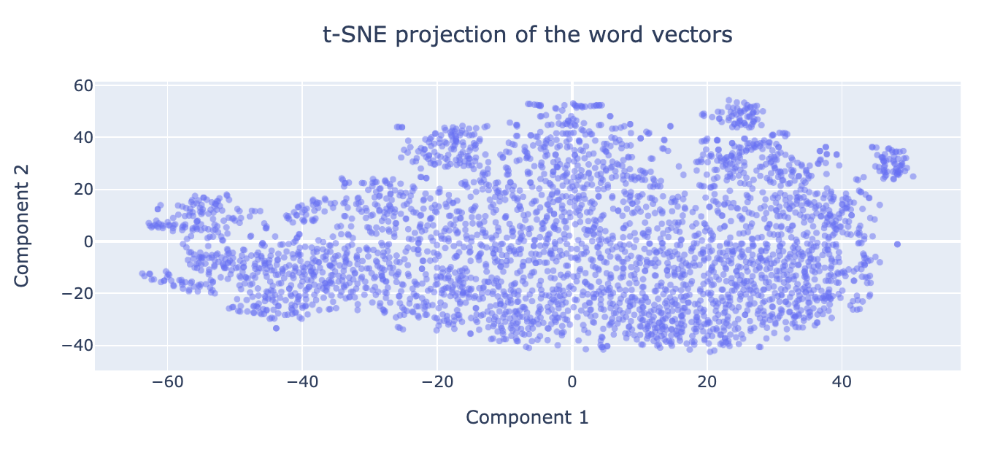

##### The cluster on the upper right side of the plot capstured my attention as it is a bit separated from the rest of the plot and has relatively high density. When scrolling over these points, I see that nearly all of the points are names of characters, which makes sense as they are semantically very similar.

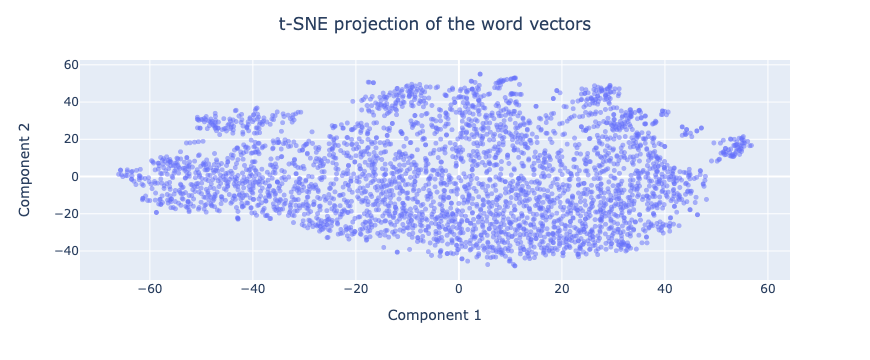

In [86]:
w2v_explorer.plot_tsne() 

# Riffs

Provde at least three visualizations that combine the preceding model data in interesting ways.

These should provide insight into how features in the LIB table are related. 

The nature of this relationship is left open to you -- it may be correlation, or mutual information, or something less well defined. 

In doing so, consider the following visualization types:

- Hierarchical cluster diagrams
- Heatmaps
- Scatter plots
- KDE plots
- Dispersion plots
- t-SNE plots
- etc.

## Riff 1 (5)

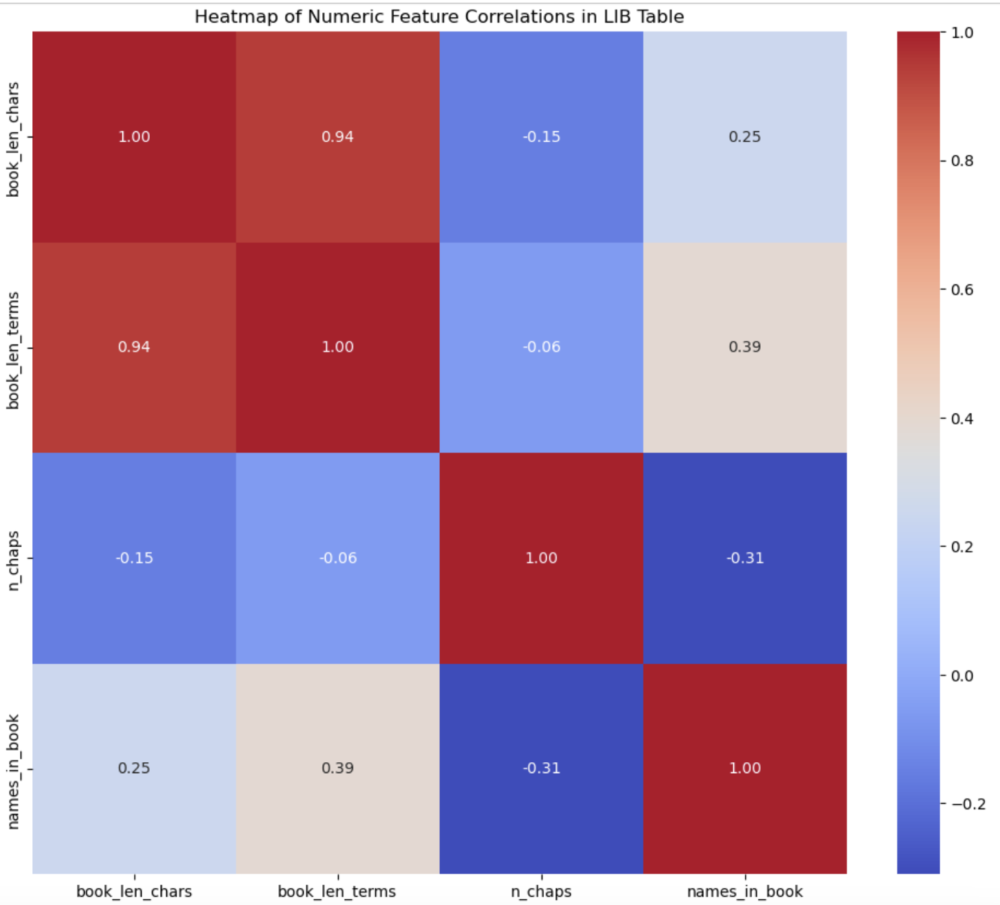

##### This heatmap displays the correlation between various numerical features of books. There is a very strong positive correlation between book_len_chars and book_len_terms, which is not surprising. Conversely, the number of names in a book  shows a slight positive correlation with the book's length, but it negatively correlates with the number of chapters, suggesting that books with fewer chapters might feature more names.

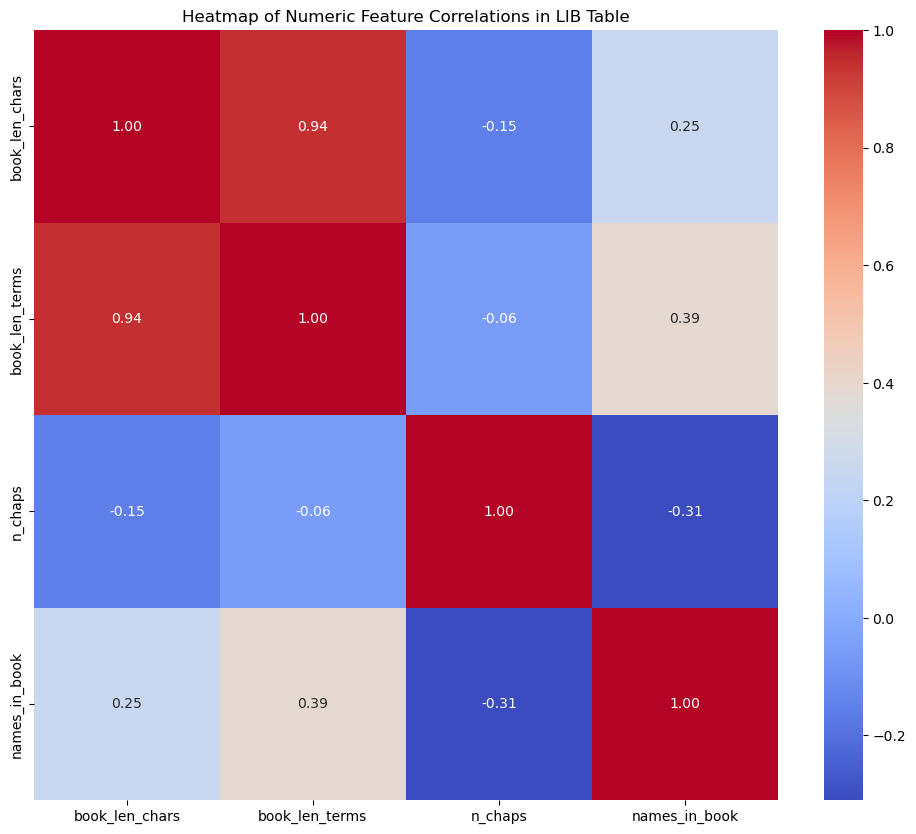

In [87]:
corr = LIB.corr(numeric_only=True)

plt.figure(figsize=(12, 10))
sns.heatmap(corr, annot=True, cmap='coolwarm', fmt=".2f")
plt.title('Heatmap of Numeric Feature Correlations in LIB Table')
plt.show()


## Riff 2 (5)

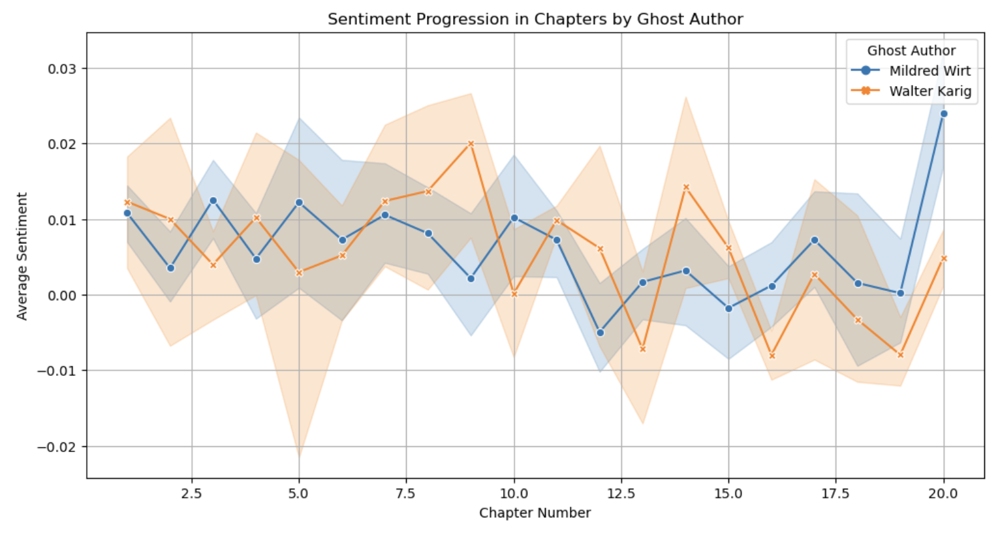

##### In this plot, Mildred Wirt's sentiment progression shows less variability compared to Walter Karig's , indicating more consistency in tone throughout her chapters. She also has a higher average sentiment level while Karig has more dramatic shifts. The wider confidence intervals for Walter Karig suggest greater variability in how sentiment is expressed or captured in his chapters. Both authors show an upward trend in sentiment in the final chapters, suggesting happy endings.

In [88]:
merged_data = DOC_SENT.merge(LIB[['ghost_author']], left_on='book_id', right_index=True, how='left')


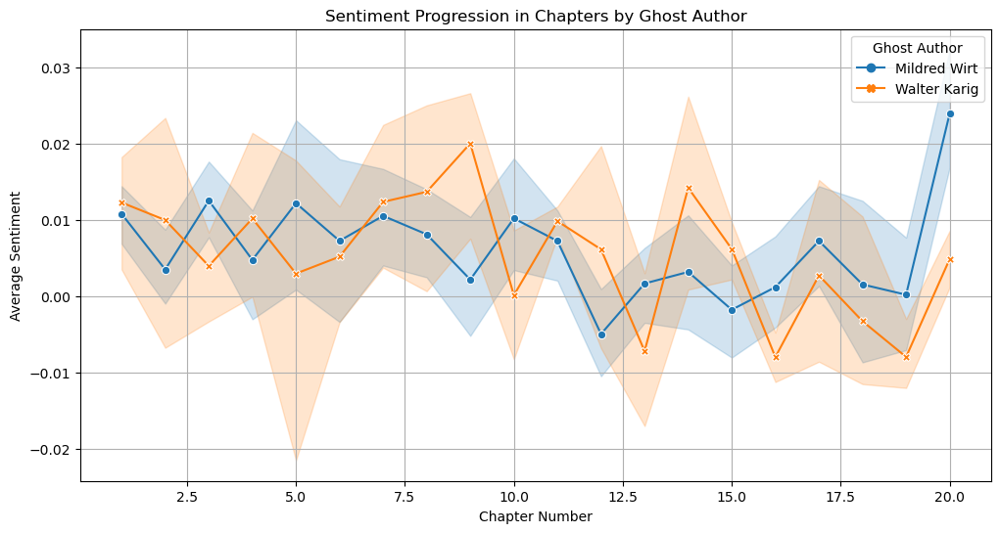

In [89]:
grouped_data = merged_data.groupby(['book_id','chap_num', 'ghost_author'])['avg_sentiment'].mean().reset_index()

# Plotting
plt.figure(figsize=(12, 6))
sns.lineplot(
    data=grouped_data,
    x='chap_num',
    y='avg_sentiment',
    hue='ghost_author', 
    style='ghost_author', 
    markers=True,  
    dashes=False  
)
plt.title('Sentiment Progression in Chapters by Ghost Author')
plt.xlabel('Chapter Number')
plt.ylabel('Average Sentiment') # Note that the shaded parts represent confidence interval which is interesting to see vary
plt.legend(title='Ghost Author')
plt.grid(True)
plt.show()

## Riff 3 (5)

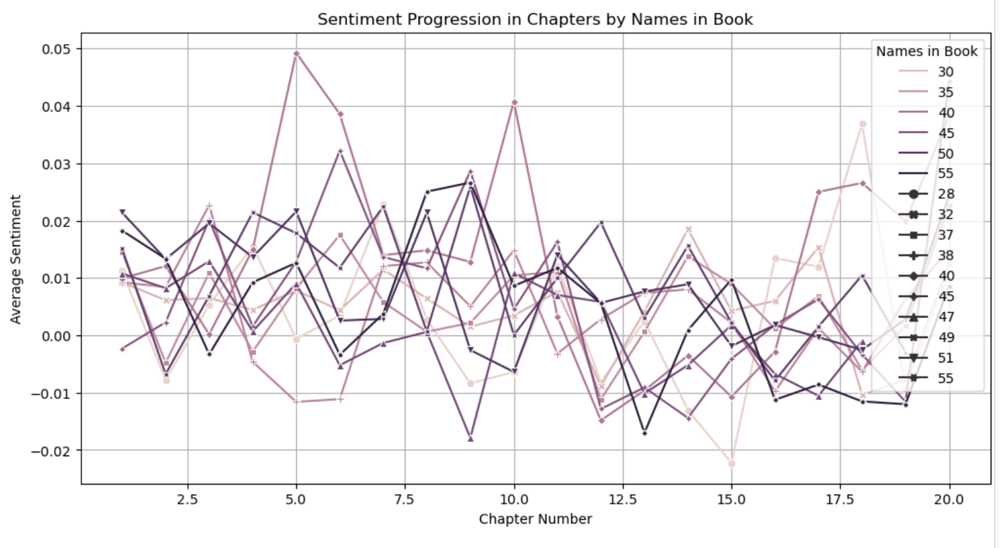

##### This plot shows in sentiment values across chapters for all books, indicating a dynamic emotional landscape within the narratives. Notably, there are sharp peaks around Chapter 10 and near the end of the books, particularly around Chapter 20, which likely correspond to climactic events or resolutions that bring positive emotional payoffs. Generally there is also a significant rise in positive sentiment towards final chapters, suggesting a trend where narratives may conclude on a positive note or resolve central conflicts in a way that results in higher positive sentiment.

In [90]:
merged_data = DOC_SENT.merge(LIB[['names_in_book']], left_on='book_id', right_index=True, how='left')


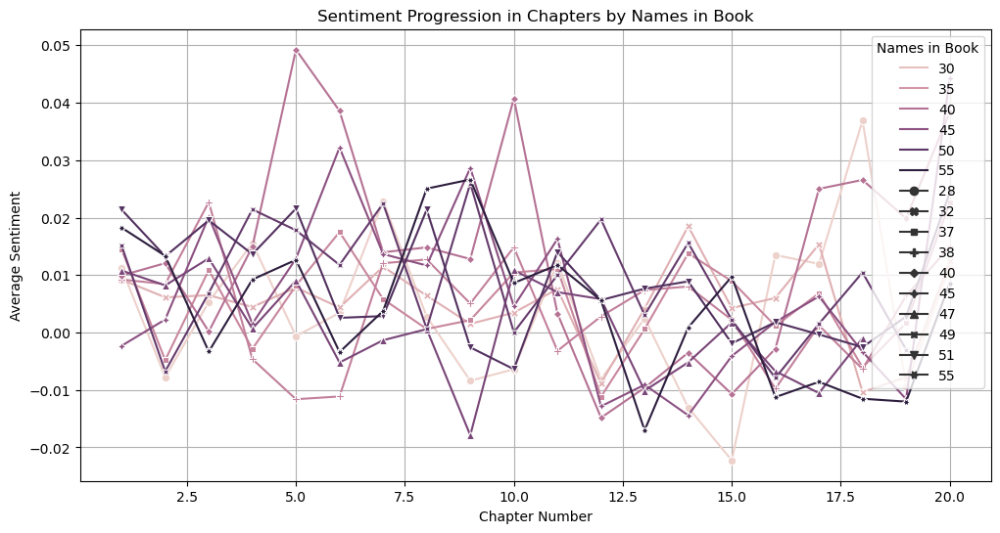

In [91]:
grouped_data = merged_data.groupby(['book_id','chap_num', 'names_in_book'])['avg_sentiment'].mean().reset_index()

# Plotting
plt.figure(figsize=(12, 6))
sns.lineplot(
    data=grouped_data,
    x='chap_num',
    y='avg_sentiment',
    hue='names_in_book', 
    style='names_in_book', 
    markers=True,  
    dashes=False,
    errorbar=None  # Made it less cluttered by removing uncertainty info
)
plt.title('Sentiment Progression in Chapters by Names in Book')
plt.xlabel('Chapter Number')
plt.ylabel('Average Sentiment')
plt.legend(title='Names in Book')
plt.grid(True)
plt.show()

# Interpretation (4)

Describe something interesting about your corpus that you discovered during the process of completing this assignment.

At a minumum, use 250 words, but you may use more. You may also add images if you'd like.

##### Throughout the process of analyzing the Nancy Drew mystery novels corpus, it was interesting to see how the narrative elements and writing styles shifted across different books attributed to different ghost authors. The distinct narrative voices of Mildred Wirt and Walter Karig were highlighted through sentiment analysis and thematic exploration using unsupervised learning models like PCA and LDA.

##### Firstly, the sentiment analysis across chapters revealed fluctuations that corresponded with significant events or climactic points within the stories. However, more interesting was the variance in sentiment when mapped against the ghost authors. Mildred Wirt’s chapters generally exhibited a more stable and positive sentiment trajectory, suggesting a narrative style that favored resolutions that were less tumultuous. In contrast, Walter Karig’s contributions displayed a more volatile sentiment pattern, indicating the introduction of dramatic twists and complexities. In addition to different writing styles, this observation could reflect differing approaches to engaging young readers or perhaps editorial directions at different times.

##### Going more into writing styles, applying PCA to the text data helped uncover underlying stylistic differences between the authors. The PCA plots clearly separated the chapters written by Wirt and Karig, suggesting that despite writing under the same pseudonym Carolyn Keene, their personal writing styles and thematic focuses influenced the narrative significantly. For instance, Wirt’s narratives were often grounded in practical and moral lessons, while Karig’s stories leaned towards adventurous and sometimes ethereal themes.

##### The LDA model further supported these findings by identifying dominant topics that corresponded closely with the thematic elements associated with each author. For example, topics related to adventure, mystery, and friendship were prevalent, but their associations with specific terms varied by author, suggesting different narrative focuses and language use.

##### Exploring one of my favorite childhood book series through text analysis highlighted the richness of these books and potential of digital humanities tools to dissect and understand literature deeply, giving insights into how books varied throughout the series despite the common pen name. The ability to quantitatively parse out these nuances allowed me to truly appreciate the series' development over time and its cultural and literary significance.






